## Mapping ALD's H.E.A.T. Data

This tutorial takes raw data from Anti-Defamation League (ADL)'s H.E.A.T. (Hate, Extremism, Antisemitism, Terrorism) database, which contains various incidents of hate, extremism, antisemitism and terrorism. These incidents are geo-coded to locality level. What we will do is (i) filter a subset of incidents from the database,  (iii) convert localities into coordinates (longitude, latitude), (iii) map them using different techniques, and (iv) produce a heatmap, and (v) a couple of static maps.

This data can be accessed here: https://www.adl.org/resources/tools-to-track-hate/heat-map

### Overview of the Tutorial

This tutorial is divided into two parts, (i) data processing and dynamic mapping, and (ii) static mapping. You can skip the dynamic mapping part if you wish only to produce some static maps.

We will do the following thing the first part:

* Imports python libraries (such as Pandas, Folium, Geopy, and Tenacity) necessary to process geospatial data.

* Load data from the CSV file into a Pandas DataFrame named 'data'.

* Look for unique values in the 'type' column of the DataFrame.

* Filter the DataFrame to only include rows where the 'type' contains the string 'Extremist/Police Shootout'.

* Add empty columns for latitude and longitude.

* And is fill those columns by iterating through each row of the DataFrame and filling in the latitude and longitude columns by calling a custom geocode_with_retry function that converts the city and state information to coordinates (latitude and longitude). The function uses the Nominatim geocoding service and includes retry logic to handle timeouts using the Tenacity library.

* Check for missing values in the latitude, longitude, and type columns, and prints the number of missing values in each column.

* Filter out rows with missing values and creates a new DataFrame called filtered_data.

* Initialize a Folium map centered on the approximate center of the United States.

* Group the filtered data by the 'type' column and creates a heatmap layer for each group. Adds the heatmap layers to the Folium map.

* Add a layer control to the map to toggle the visibility of the heatmap layers.

* Save the map as an HTML file named 'heat_map_shoutout.html'.

* Drop rows with missing latitude or longitude values from the original DataFrame.

* Saves the cleaned data to a new CSV file named 'shourout.csv'.

And the following things in the second part:
* Import a file containing data points with predefined longitude and latitude columns.

* Create some dynamic maps.
* Import a geographic shape file. 
* Map those points on that shape file to create static maps.
* Create Hexagonal Maps.

#### Let's install the libraries we will be using

In [ ]:
!pip install pandas
!pip install folium
!pip install geopy
!pip install tenacity
!pip install tqdm
!pip install plotly
!pip install kaleido
!pip install openpyxl
!pip install matplotlib
!pip install geopandas

____________________________________________________________________________________________

# Part 1

Importing the **Pandas** library using the alias 'pd'.


Pandas is a popular and easy to-to-use library for data manipulation and analysis.
* It has two core data structures: (i) **Series**, which is one-dimensional labeled array (*column*) capable of holding any data type (integers, strings, floating-point numbers, Python objects, etc.), and **Dataframe**, which is a two-dimensional labeled data structure with multiple columns (i.e., series). 

* It can process most data formats like .dta (Stata), RData (R), CSV, XLSX (Excel), SQL etc.

In [2]:
import pandas as pd

Importing the **Folium** library

Folium is powerful but easy to use library for visualizing geospatial data, that creates interactive maps.
* The **HeatMap** plugin from Folium to create heatmap layers on the interactive Folium map.

In [3]:
import folium
from folium.plugins import HeatMap

Importing  the **Nominatim** and **GeocoderTimedOut** moduels from **Geopy** library.

**Geopy** is a Python library used for geocoding, which is the process of converting addresses or location names into geographic coordinates (latitude and longitude). Geopy provides a simple and consistent interface to interact with multiple geocoding services, such as Google Maps, OpenStreetMap, Bing Maps, and others.

* **Nominatim** is one of those geocoding service that converts addresses and location names into geographic coordinates (latitude and longitude) using OpenStreetMap.

* **GeocoderTimedOut** handles exceptions is raised when geocoding request times out.

In [4]:
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut

Importing  **retry**, **stop_after_attempt**, **wait_fixed**, **retry_if_exception_type** modules from **Tenacity** library

Tenacity is a library that provides a simple and flexible way to add retry behavior to functions and methods.

* **retry** function is used to retry running a functions under some stop condition is met.

* **stop_after_attempt** function is used to define a stopping condition for the retry mechanism. When used with the retry decorator, it specifies the maximum number of attempts the function should be retried before giving up.
* **wait_fixed** functions defines a waiting strategy between retry attempts. When used with the retry decorator, it specifies a fixed waiting time (in seconds) between each retry attempt.
* **retry_if_exception_type** function is used to define a condition for retrying based on the type of exception raised by the function. When used with the retry decorator, it allows us to retry the function only when it raises specific exceptions.

These functions are particularly useful when working with operations that may fail transiently, such as pulling data from an API or using other operations that has built-in wait time and other obstacles.

In [5]:
from tenacity import retry, stop_after_attempt, wait_fixed, retry_if_exception_type

Importing **tqdm** library

tqdm is a progress bar library for that provides visual feedback during the execution of loops or other iterable objects.

In [6]:
from tqdm import tqdm

____________________________________________________________________________________________

We will work with  ADL's H.E.A.T. events data contained in a an excel file named '**adl.xlsx**'. The following code reads that file into a a Pandas DataFrame named **data**.

In [7]:
data = pd.read_excel('adl.xlsx')

Now we use Pandas' built-in **unique()** function for unique values in the 'type' column of the dataframe 'data'. The 'type' column contain various types of event as shown in the output.


In [8]:
data.type.unique()

array(['White Supremacist Event', 'Extremist Murder',
       'White Supremacist Propaganda',
       'Antisemitic Incident:Harassment;White Supremacist Propaganda',
       'Antisemitic Incident:Harassment',
       'Antisemitic Incident:Vandalism',
       'Antisemitic Incident:Harassment;White Supremacist Event',
       'Antisemitic Incident:Vandalism;White Supremacist Propaganda',
       'Antisemitic Incident:Assault',
       'Extremist Murder;Extremist/Police Shootout',
       'Terrorist Plot/Attack', 'Extremist Murder;Terrorist Plot/Attack',
       'Extremist/Police Shootout',
       'Antisemitic Incident:Vandalism;Terrorist Plot/Attack',
       'Extremist Murder;Extremist/Police Shootout;Terrorist Plot/Attack',
       'Antisemitic Incident:Assault;Extremist Murder',
       'Extremist/Police Shootout;Terrorist Plot/Attack',
       'Antisemitic Incident:Assault;Extremist Murder;Extremist/Police Shootout;Terrorist Plot/Attack',
       'Antisemitic Incident:Harassment;Terrorist Plot/Atta

We now filter the 'type' of event we are interested in mapping from the list of events generated by the previous code. 

We use the **str.constains()** function to filter the observations containing the string we are looking for in the data and return those observations.

For example: the *data[data['type'].str.contains('White Supremacist Event')]* returns all observations that contain the *'White Supremacist Event'* string.

We, however, are looking for the string *'Extremist/Police Shootout'* because it contains fewer events and, hence, easier to geocode given the time constraints in this tutorial.

In [9]:
data = data[data['type'].str.contains('Police Shootout')]

Let's see what we have. The dataset now contains only the events that were labelled as *Extremist/Police Shootout*

In [10]:
data

,id,date,city,state,type,ideology,subideology,group,description,image
2426,33502,2022-09-11,Walled Lake,MI,Extremist Murder;Extremist/Police Shootout,Right Wing (Other),NaN,NaN,Igor Lanis fatally shot his wife and wounded o...,NaN
6881,25776,2022-03-31,Dudleyville,AZ,Extremist/Police Shootout,Right Wing (White Supremacist),NaN,NaN,According to the Pinal County Sheriff's Office...,NaN
9750,20441,2021-12-27,Denver,CO,Extremist Murder;Extremist/Police Shootout,Right Wing (Other),NaN,NaN,Lyndon McLeod went on a multi-location shootin...,NaN
10915,20464,2021-11-05,Hoschton,GA,Extremist Murder;Extremist/Police Shootout,Right Wing (Anti-Government),NaN,NaN,"Jessica Worsham, an anti-government sovereign ...",NaN
11647,20390,2021-10-29,Tecumseh,OK,Extremist Murder;Extremist/Police Shootout,Right Wing (Anti-Government),NaN,NaN,"Braedon Chesser, an anti-government extremist ...",NaN
...,...,...,...,...,...,...,...,...,...,...
35967,945,2009-05-01,Fort Walton Beach and Crestview,FL,Extremist Murder;Extremist/Police Shootout,Right Wing (Anti-Government),NaN,NaN,"Joshua Cartwright, 28, allegedly assaulted his...",NaN
35969,1948,2009-04-04,Pittsburgh,PA,Extremist Murder;Extremist/Police Shootout,Right Wing (White Supremacist),NaN,NaN,Richard Andrew Poplawski shot and killed three...,NaN
35976,335,2009-01-21,Brockton,MA,Extremist Murder;Extremist/Police Shootout;Ter...,Right Wing (White Supremacist),NaN,NaN,"Keith Luke, 22, went on a racially motivated s...",NaN
36006,192,2007-08-10,Bastrop,LA,Extremist Murder;Extremist/Police Shootout,Right Wing (White Supremacist),NaN,Aryan Circle,Aryan Circle member Dennis Clem shot and kille...,NaN


**Now we will convert the locations to coordinates (longitude and latitude) using the city and state information.**

For that we will first add empty columns for latitude and longitude and write a function to fill them in interatively using the Nominatim geocoding service.

In [11]:
data['latitude'] = None
data['longitude'] = None

The following code creates a Nominatim geolocator object with a custom user agent ("heat_map_geocoder") and a timeout of 20 seconds. 

*The **user_agent** parameter helps identify our application to the geocoding service (name is arbitrary), while the **timeout** parameter specifies the maximum time (in seconds) the geolocator should wait for a response from the service.

In [12]:
geolocator = Nominatim(user_agent="heat_map_geocoder", timeout=20)

The **retry** decorator from the **tenacity** library aplies to the **geocode_with_retry** function defined in the next line. 

It adds retry behavior to the function, with the following configuration:

* **stop=stop_after_attempt(10)**: Retry the function up to a maximum of 10 attempts. The servers might be busy in one attempt so it tells the system to do it again. 

* **wait=wait_fixed(2)**: Wait for 2 seconds between each retry attempt. Some servers limit that time between requests (OSM does too). It happens mostly with APIs.

* **retry=retry_if_exception_type(GeocoderTimedOut)**: Retry the function only if it raises an exception of type GeocoderTimedOut, which is an exception raised by geopy when the geocoding request times out.

THe function itself does the following things:

* **def geocode_with_retry(location_str)** defines the **geocode_with_retry function**, which takes a single argument **location_str** representing the location string to be geocoded. We willd efined this location string in the next line.

* **return geolocator.geocode(location_str)**: functions processes the location string, puts it through Nominatim's geolocator and returns the geographical coordinates (latitude and longitude) of the input location.

In [13]:
@retry(stop=stop_after_attempt(10), wait=wait_fixed(2), retry=retry_if_exception_type(GeocoderTimedOut))

def geocode_with_retry(location_str):
    return geolocator.geocode(location_str)


The following code contains a **for loop** that processes each row, geocodes its 'city' and 'state' columns using the geocode_with_retry function, and updates the DataFrame with the resulting latitude and longitude.

The **tdqm** library invoked here calculates time required to process each individual row to show a progress bar until every row is processed.

**Note:** Sometimes this code chunk would fail. It is because the Nominatim geolocation service we use is provided by OSM maps. The code fails because the servers are too busy to process our requests or our internet connection is bad.

In [14]:
for index, row in tqdm(data.iterrows(), total=data.shape[0]):
    location = geocode_with_retry(f"{row['city']}, {row['state']}")
    if location:
        data.at[index, 'latitude'] = location.latitude
        data.at[index, 'longitude'] = location.longitude


100%|██████████| 131/131 [01:06<00:00,  1.96it/s]


Sometimes geolocation goes smoothly and sometimes not. It is because of spelling mistakes/difference, and the geolocator cannot locate the coordinates for the given location's name. It would then leave the observation empty/missing. 

The following code helps us locate those missing values before plotting.

In [15]:
missing_values = data[['latitude', 'longitude', 'type']].isna().sum()
print("Missing values in each column:")
print(missing_values)


Missing values in each column:
latitude     1
longitude    1
type         0
dtype: int64


The following code helps us identify which locations were not geocoded properly. If they are terribly important for our project, we can find and correct them. Here it seems like the report combines two localities (i) Fort Walton Beach and (ii) Crestview into one name that the geolocator then couldn't process. 

In [16]:
missing_locations = data[data['latitude'].isna() | data['longitude'].isna() | data['type'].isna()]
print("Rows with missing latitude, longitude, or type values:")
print(missing_locations[['city', 'state']])


Rows with missing latitude, longitude, or type values:
                                  city state
35967  Fort Walton Beach and Crestview    FL


If we use the columns with missing values, we can get an error in plotting these points because the program cannot plot what's missing. We can deal with it by dropping the locations that our program could not geolocate.

Best practice however is to locate them and make necessary corrections.

In [17]:
data = data.dropna(subset=['latitude', 'longitude', 'type'])
data

,id,date,city,state,type,ideology,subideology,group,description,image,latitude,longitude
2426,33502,2022-09-11,Walled Lake,MI,Extremist Murder;Extremist/Police Shootout,Right Wing (Other),NaN,NaN,Igor Lanis fatally shot his wife and wounded o...,NaN,42.537811,-83.481048
6881,25776,2022-03-31,Dudleyville,AZ,Extremist/Police Shootout,Right Wing (White Supremacist),NaN,NaN,According to the Pinal County Sheriff's Office...,NaN,32.908704,-110.722061
9750,20441,2021-12-27,Denver,CO,Extremist Murder;Extremist/Police Shootout,Right Wing (Other),NaN,NaN,Lyndon McLeod went on a multi-location shootin...,NaN,39.739236,-104.984862
10915,20464,2021-11-05,Hoschton,GA,Extremist Murder;Extremist/Police Shootout,Right Wing (Anti-Government),NaN,NaN,"Jessica Worsham, an anti-government sovereign ...",NaN,34.096496,-83.761284
11647,20390,2021-10-29,Tecumseh,OK,Extremist Murder;Extremist/Police Shootout,Right Wing (Anti-Government),NaN,NaN,"Braedon Chesser, an anti-government extremist ...",NaN,35.25785,-96.936689
...,...,...,...,...,...,...,...,...,...,...,...,...
35948,710,2009-10-28,Dearborn,MI,Extremist/Police Shootout,Islamist,NaN,Ummah,Law enforcement agents fatally shot Luqman Ame...,NaN,42.32226,-83.176315
35969,1948,2009-04-04,Pittsburgh,PA,Extremist Murder;Extremist/Police Shootout,Right Wing (White Supremacist),NaN,NaN,Richard Andrew Poplawski shot and killed three...,NaN,40.441694,-79.990086
35976,335,2009-01-21,Brockton,MA,Extremist Murder;Extremist/Police Shootout;Ter...,Right Wing (White Supremacist),NaN,NaN,"Keith Luke, 22, went on a racially motivated s...",NaN,42.083433,-71.018379
36006,192,2007-08-10,Bastrop,LA,Extremist Murder;Extremist/Police Shootout,Right Wing (White Supremacist),NaN,Aryan Circle,Aryan Circle member Dennis Clem shot and kille...,NaN,32.776145,-91.908297


**Now we create a Folium map centered at the approximate geographical center of the United States to plot our coordinates.**

* **map_center** = [39.8283, -98.5795] is a list that contains the latitude and longitude coordinates of the approximate center of the United States.
* **base_map** creates a Folium map object that has sets the initial center of the map to the coordinates specified in the map_center list, and sets the initial zoom level of the map. 

**Note:** A lower zoom level (e.g., 5) shows a larger area, while a higher zoom level (e.g., 15) shows a smaller area with more detail.

In [18]:
map_center = [39.8283, -98.5795]  # Approximate center of the United States
base_map = folium.Map(location=map_center, zoom_start=5)


The following code has an element **grouped_data**, which is useful when we are working with data of different types. We have already filtered our type of interest to ease the geocoding process, but it still has many different types that contain the string 'Extremist/Police Shootout'. This could be even more useful when we have different nature of event. 

Anyhow, it takes the latitude and longitude points for each observation and add them to a **heatmap** object, and then adds that to the **base_map**.

It also adds a layer control interface that allows users to interactively toggle the visibility of different map layers on the map.

In [19]:
grouped_data = data.groupby('type') #useful when different type of events are in the dataframe

for name, group in grouped_data:
    heat_data = [[row['latitude'], row['longitude']] for index, row in group.iterrows()]
    HeatMap(heat_data, name=name).add_to(base_map)
    
folium.LayerControl().add_to(base_map)

The following code exports the basemap with the heatmap layer to an interactive html file.

In [20]:
base_map.save('shootout.html')

The following code exports the filtered 'shootout' data to an excel file for reproducibility purpose.

**Note:** you can also export it as csv using *data.to_csv('shoutout.csv')*.

In [21]:
data.to_excel('shootout.xlsx')

____________________________________________________________________________________________

# Part 2

I have separate files different type of events following the same routine described above. Some of these events are in thousands so it was not feasible to process them in class.

The following code chunks produce various charts and maps based on these individual files. 

For example, the following chunks takes a data file of White Supremacist Events with pre-defined coordinates, plot their frequencies over the states and years, create a heatmap.

**Note:** You don't need to reload the libraries before running each chunk. I have left them there just in case you would like to use the code for some other project.

#### Distribution of White Supremacist Events over the US states

Total number of events: 578


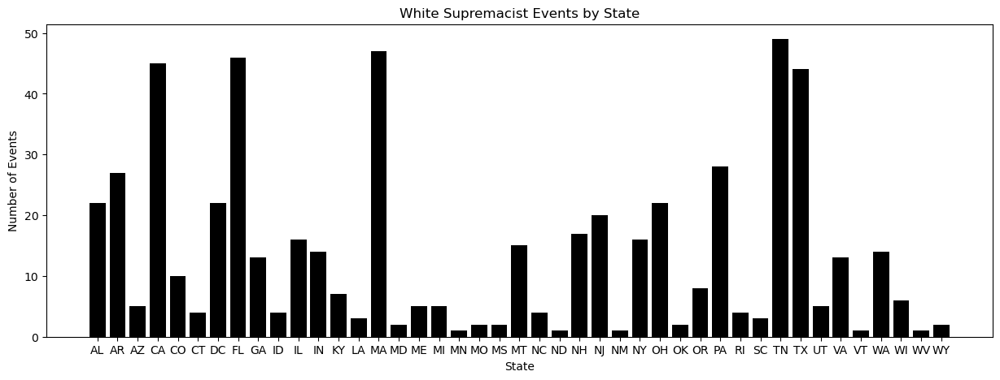

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data into a Pandas DataFrame
data = pd.read_excel('white_supremacist_event.xlsx')

# Get total count of events and print it
count_events= len(data.index)
print(f'Total number of events: {count_events}')

# Get the count of events per state 
state_counts = data.groupby('state').size().reset_index(name='count')

# Create a bar chart of the state counts
plt.figure(figsize=(15, 5)) #change the size as you wish
plt.bar(state_counts['state'], state_counts['count'], color='black')
plt.xlabel('State')
plt.ylabel('Number of Events')
plt.title('White Supremacist Events by State')
plt.show()



#### Distribution of White Supremacist Events over years

Total number of events: 578


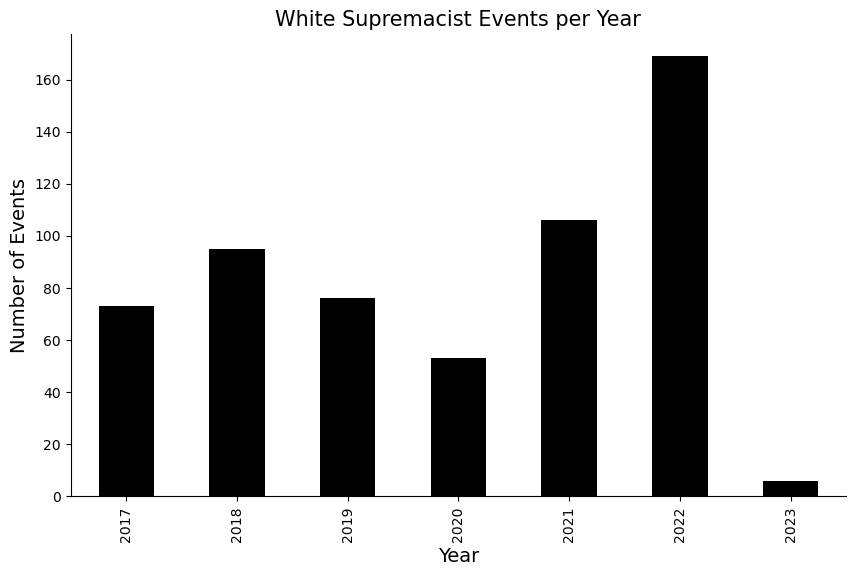

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

# Load the data into a Pandas DataFrame
data = pd.read_excel('white_supremacist_event.xlsx')

# Get total count of events and print it
count_events= len(data.index)
print(f'Total number of events: {count_events}')


# Convert the date column to a datetime object
data['date'] = pd.to_datetime(data['date'], format='%m/%d/%y')

# Get the count of events per year
yearly_counts = data.groupby(data['date'].dt.year).size().reset_index(name='count')

# Plot the bar chart
ax = yearly_counts.plot(x='date', y='count', kind='bar', figsize=(10,6), color='black', legend=False)

# Set the title and axis labels
ax.set_title('White Supremacist Events per Year', fontsize=15)
ax.set_xlabel('Year', fontsize=14)
ax.set_ylabel('Number of Events', fontsize=14)

# Set the x-axis tick labels to be the years
ax.set_xticklabels(yearly_counts['date'].astype(int).values)

# Remove the top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Show the plot
plt.show()


#### Heatmap of White Supremacist Events

In [24]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# Load the data into a Pandas DataFrame
data = pd.read_excel('white_supremacist_event.xlsx')

# Get total count of events and print it
count_events= len(data.index)
print(f'Total number of events: {count_events}')


# Create a base map centered on the United States
map_center = [39.8283, -98.5795]  # Approximate center of the United States
base_map = folium.Map(location=map_center, zoom_start=5)

# Extract heat data from the DataFrame
heat_data = data[['latitude', 'longitude']].values.tolist()

# Add a heatmap layer to the base map
HeatMap(heat_data).add_to(base_map)

# Save the map as an HTML file
base_map.save('white_supermacist_event.html')


Total number of events: 578


#### Location/Bubble Map of White Supremacist Events

In [25]:
import pandas as pd
import folium

# Load the data into a Pandas DataFrame
data = pd.read_excel('white_supremacist_event.xlsx')


# Get total count of events and print it
count_events= len(data.index)
print(f'Total number of events: {count_events}')

# Create a base map centered on the United States
map_center = [39.8283, -98.5795]  # Approximate center of the United States
base_map = folium.Map(location=map_center, zoom_start=5)

# Function to add a circle marker for each event
def add_marker(row):
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,  # You can adjust the radius based on the desired circle size
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.7
    ).add_to(base_map)

# Apply the add_marker function to each row in the DataFrame
data.apply(add_marker, axis=1)

# Save the map as an HTML file
base_map.save('white_supermacist_event_bubble_map.html')


Total number of events: 578


#### Plotting White Supramacist Propaganda using an additional shape file

Map plygons are contained in .shp, .json, etc. datafiles. These are geometric information that the program processes to chart the map. 

So far, we have worked with information that was contained in various packages (plotly, folium etc.). Sometimes, you might need an additional file that contains geographic information on what is being plotted. That where we import an additional file (.shp, .json, etc.). This code does that.

C:\Users\abade\AppData\Roaming\jupyterlab-desktop\jlab_server\lib\site-packages\geopandas\_compat.py:123: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
C:\Users\abade\AppData\Local\Temp\ipykernel_3612\3886356657.py:2: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0

Total number of events: 19083


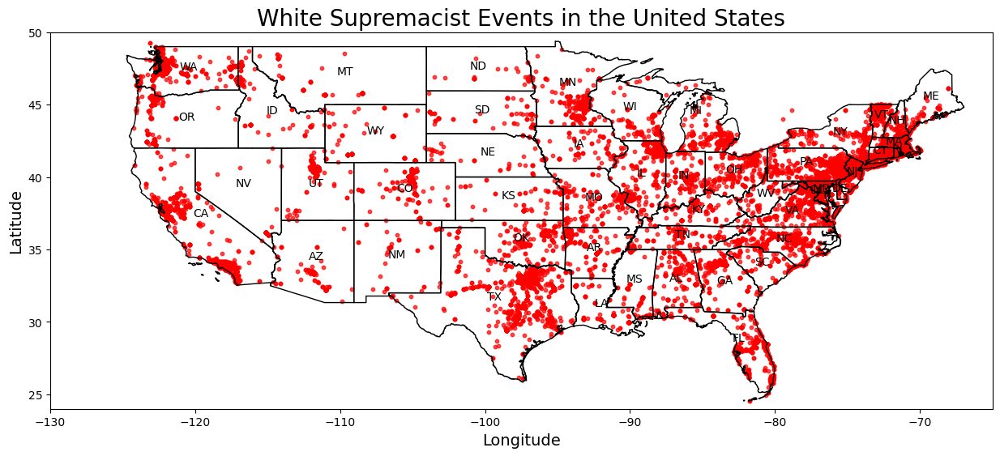

In [26]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the data into a Pandas DataFrame
data = pd.read_excel('white_supremacist_propaganda.xlsx')

# Get total count of events and print it
count_events= len(data.index)
print(f'Total number of events: {count_events}')


# Create a GeoDataFrame from the DataFrame from the coordinate information we generated previously
gdf = gpd.GeoDataFrame(data, geometry=gpd.points_from_xy(data.longitude, data.latitude))

# Load US states data as a GeoDataFrame with state abbreviations
states = gpd.read_file("us_states.json")

# We are using a local .json file but you can import that from the web too. 
#states = gpd.read_file("https://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_5m.json") 

# Create a matplotlib figure
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the US states
states.boundary.plot(ax=ax, linewidth=1, color='black')

# Add title and labels
ax.set_title('White Supremacist Events in the United States', fontsize=20)
ax.set_xlabel('Longitude', fontsize=14)
ax.set_ylabel('Latitude', fontsize=14)

# Plot the points on the map
gdf.plot(ax=ax, color='red', alpha=0.7, markersize=10)

# Set the map extent (longitude and latitude bounds) to focus on the United States
ax.set_xlim(-130, -65)
ax.set_ylim(24, 50)

# Add state abbreviations as labels
for idx, row in states.iterrows():
    ax.annotate(row['Abbreviation'], xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
                 horizontalalignment='center', fontsize=10, color='black', alpha=1)

# Display the map
plt.show()


#### Hexagonal Plot

Total number of events: 578


C:\Users\abade\AppData\Local\Temp\ipykernel_3612\3958159255.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  hexgrid_counts['centroid'] = hexgrid_counts['geometry'].centroid


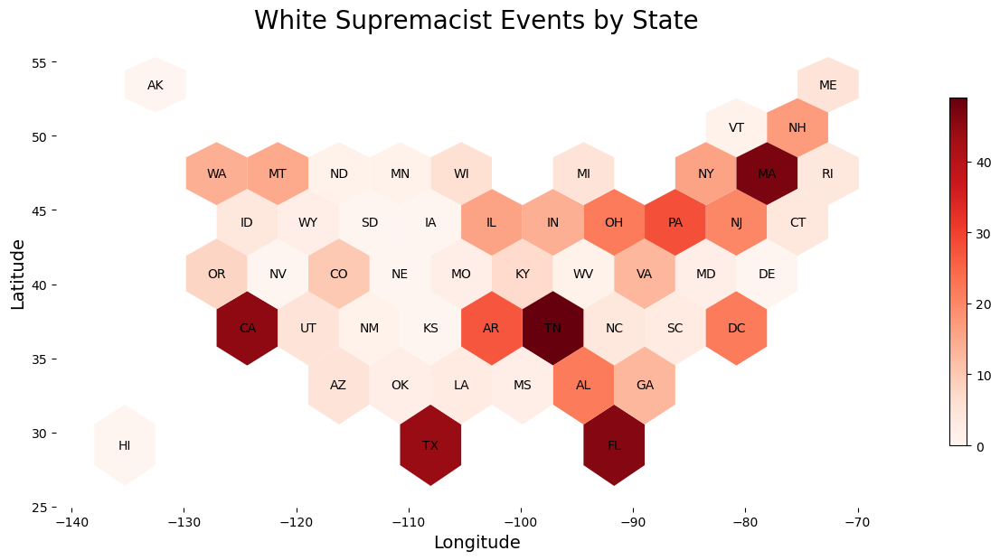

In [27]:
# Import the necessary libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the data into a Pandas DataFrame
data = pd.read_excel('white_supremacist_event.xlsx')

# Get total count of events and print it
count_events= len(data.index)
print(f'Total number of events: {count_events}')


# Get the count of events per state
state_counts = data.groupby('state').size().reset_index(name='count')

# Load the hexgrid data as a GeoDataFrame / we are once again using an additional shape file
hexgrid = gpd.read_file('https://raw.githubusercontent.com/holtzy/The-Python-Graph-Gallery/master/static/data/us_states_hexgrid.geojson.json')

# Merge the hexgrid data with the state counts using a left join
hexgrid_counts = hexgrid.merge(state_counts, left_on='iso3166_2', right_on='state', how='left')

# Fill NaN values in the 'count' column with 0
hexgrid_counts['count'] = hexgrid_counts['count'].fillna(0)

# Add a "centroid" column with the centroid position of each hexbin
hexgrid_counts['centroid'] = hexgrid_counts['geometry'].centroid

# Set the plot size for this notebook:
plt.rcParams["figure.figsize"]=13,13

# Plot the hexbin map
ax = hexgrid_counts.plot(column='count', cmap='Reds', figsize=(15, 10), legend=True, legend_kwds={'shrink': 0.5})

# For each hexbin, annotate with the number of events that occurred in that area
for idx, row in hexgrid_counts.iterrows():
    ax.annotate(text=row['iso3166_2'], xy=row['centroid'].coords[0], horizontalalignment='center', va='center', color='black')

# Set the title and axis labels
ax.set_title('White Supremacist Events by State', fontsize=20)
ax.set_xlabel('Longitude', fontsize=14)
ax.set_ylabel('Latitude', fontsize=14)

# Remove the axis spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# Show the plot
plt.show()


#### Ineractive Bubble of White Supremacist Events

Total number of events: 21579


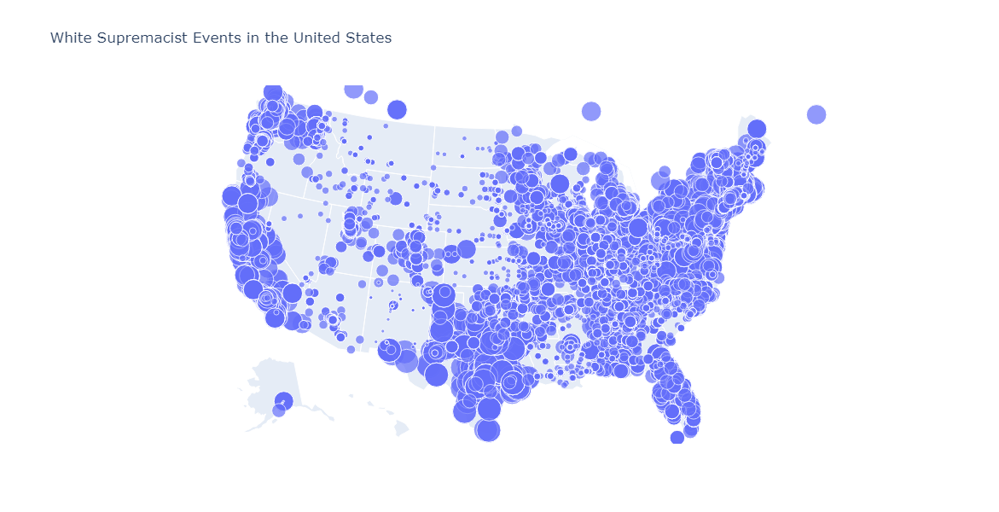

In [28]:
import pandas as pd
import plotly.express as px
import plotly.io as pio

# Load the data into a Pandas DataFrame
data = pd.read_excel('white_supremacist_all.xlsx')

# Get total count of events and print it
count_events= len(data.index)
print(f'Total number of events: {count_events}')

# Group the data by state and count the number of events in each state
state_counts = data.groupby('state').size().reset_index(name='event_count')

# Merge the grouped data back into the original DataFrame
data = data.merge(state_counts, on='state')

# Create a bubble map using plotly.express.scatter_geo()
fig = px.scatter_geo(data, lat='latitude', lon='longitude',
                     size='event_count',  # Set the size of the bubbles based on the count of events
                     hover_name='type',  # Replace 'event' with a column containing event descriptions or names
                     hover_data={'state': True, 'city': True},  # Add the two-letter state abbreviation to the hover text
                     scope='usa',
                     title='White Supremacist Events in the United States')

# Change the size of the map
fig.update_layout(autosize=False, width=1000, height=600)

# Show the plot
fig.show()

# Save the map as an HTML file
#pio.write_html(fig, file='white_supremacist_events_map.html')